# Satellite Image Analysis: Dimensionality Reduction and Pixel-Wise Clustering

[RasterIO](https://rasterio.readthedocs.io/en/stable/) is used along with [EarthPy](https://earthpy.readthedocs.io/en/latest/index.html) to load an process the TIFF images separated in different bands.

Note that EarthPy has [example datasets](https://earthpy.readthedocs.io/en/latest/earthpy-data-subsets.html).

#### Table of Contents

1. Imports
2. Visualize Data
3. Preprocessing

## 1. Imports

In [48]:
from glob import glob

import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep

import rasterio as rio
from rasterio.plot import plotting_extent
from rasterio.plot import show
from rasterio.plot import reshape_as_raster, reshape_as_image

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from scipy.io import loadmat

from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

import plotly.express as px

In [3]:
DATA_PATH = "../data/Satellite_Imagery/"

In [5]:
sentinel_bands = glob(DATA_PATH+"Aquileia_Italy/*B?*.tiff")

In [6]:
sentinel_bands.sort()
sentinel_bands

['../data/Satellite_Imagery/Aquileia_Italy/2019-04-16-00_00_2019-04-16-23_59_Sentinel-2_L2A_B01_(Raw).tiff',
 '../data/Satellite_Imagery/Aquileia_Italy/2019-04-16-00_00_2019-04-16-23_59_Sentinel-2_L2A_B02_(Raw).tiff',
 '../data/Satellite_Imagery/Aquileia_Italy/2019-04-16-00_00_2019-04-16-23_59_Sentinel-2_L2A_B03_(Raw).tiff',
 '../data/Satellite_Imagery/Aquileia_Italy/2019-04-16-00_00_2019-04-16-23_59_Sentinel-2_L2A_B04_(Raw).tiff',
 '../data/Satellite_Imagery/Aquileia_Italy/2019-04-16-00_00_2019-04-16-23_59_Sentinel-2_L2A_B05_(Raw).tiff',
 '../data/Satellite_Imagery/Aquileia_Italy/2019-04-16-00_00_2019-04-16-23_59_Sentinel-2_L2A_B06_(Raw).tiff',
 '../data/Satellite_Imagery/Aquileia_Italy/2019-04-16-00_00_2019-04-16-23_59_Sentinel-2_L2A_B07_(Raw).tiff',
 '../data/Satellite_Imagery/Aquileia_Italy/2019-04-16-00_00_2019-04-16-23_59_Sentinel-2_L2A_B08_(Raw).tiff',
 '../data/Satellite_Imagery/Aquileia_Italy/2019-04-16-00_00_2019-04-16-23_59_Sentinel-2_L2A_B09_(Raw).tiff',
 '../data/Satellite

In [7]:
# Open rasters with Rasterio
images = []
for i in sentinel_bands:
    with rio.open(i, 'r') as f:
        images.append(f.read(1))

In [8]:
images_array = np.stack(images)

In [9]:
# 12 bands/channels with images of size (h,w) = (954, 298)
images_array.shape

(12, 689, 1200)

In [10]:
type(images_array)

numpy.ndarray

## 2. Visualize Data

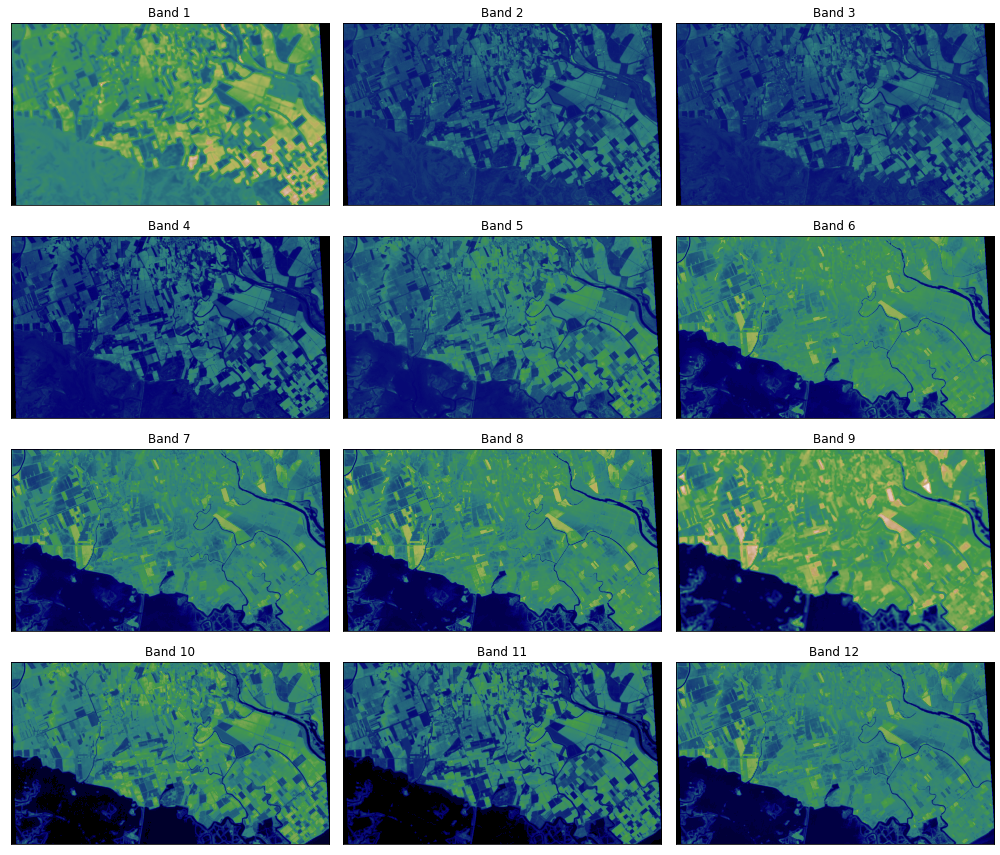

In [12]:
# Plot all bands
ep.plot_bands(images_array, cmap = 'gist_earth', figsize = (14, 12), cols = 3, cbar = False)
plt.show()

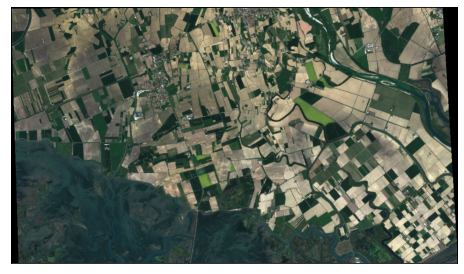

In [14]:
# Plot RGB image
rgb = ep.plot_rgb(images_array, 
                  rgb=(3,2,1), # (default = (0, 1, 2))) indices of the three RGB bands,
                  stretch=True, # apply linear stretch
                  str_clip=0.02, # pcnt of clip in linar stretch, default 2 = 2%
                  figsize=(8, 10))
plt.show()

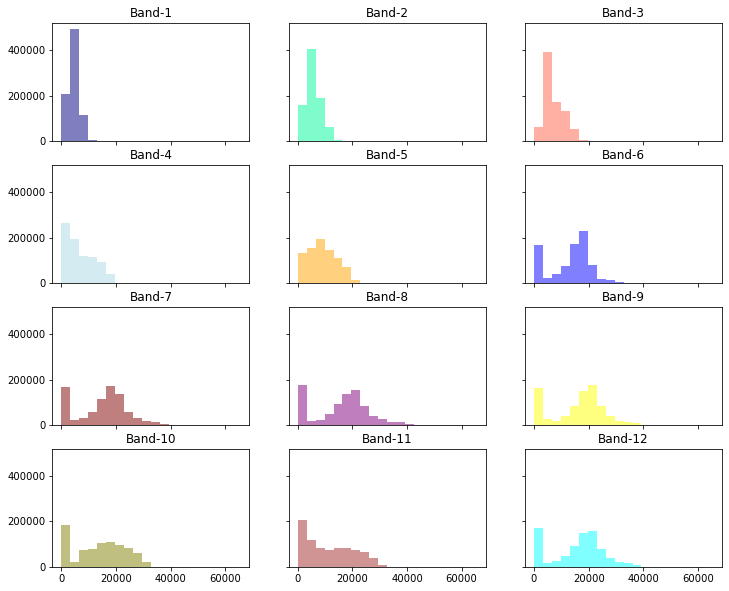

In [15]:
# Pixel value distributions: histograms
colors = ['navy', 'MediumSpringGreen', 'tomato', 'lightblue', 'orange', 'blue',
          'maroon', 'purple', 'yellow', 'olive', 'brown', 'cyan']
ep.hist(images_array, 
        colors = colors,
        title=[f'Band-{i}' for i in range(1, 13)], 
        cols=3, 
        alpha=0.5, 
        figsize=(12, 10))
plt.show()

## 3. Preprocessing: Reshape, Scale

In [16]:
# Move channel/band dim to last position
X = np.moveaxis(images_array, 0, -1)
X.shape

(689, 1200, 12)

In [17]:
X.min()

0

In [18]:
X.max()

65535

In [19]:
# Scale and reshape features/image pixel values
X = X.reshape(-1, 12)
scaler = StandardScaler().fit(X)
X_scaled = scaler.transform(X)

X_scaled.shape

(826800, 12)

## 4. Dimensionality Reduction: PCA

In [21]:
pca = PCA(n_components = 12)

pca.fit(X_scaled)

data = pca.transform(X_scaled)

In [22]:
pca.explained_variance_ratio_

array([6.89538136e-01, 2.74982823e-01, 1.73993820e-02, 9.44748090e-03,
       3.36408587e-03, 2.25535255e-03, 1.15611546e-03, 7.46183472e-04,
       4.94683974e-04, 3.17480345e-04, 2.33117278e-04, 6.51586336e-05])

In [25]:
# How many components do we need?
cumsum = np.cumsum(pca.explained_variance_ratio_)
d = np.argmax(cumsum >=0.99) + 1
print(d)

4


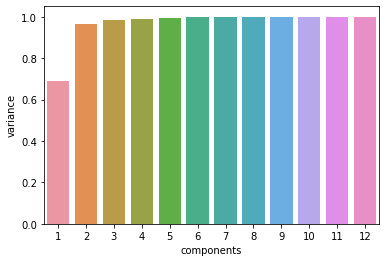

In [31]:
# Plot the accumulated explained variance ratio in terms of the chosen dimensions
component_variance_df = pd.DataFrame(data=cumsum.ravel(), columns=['variance'])
component_variance_df['components'] = range(1,X_scaled.shape[1]+1)
bplot = sns.barplot(data=component_variance_df, x='components', y = 'variance')

In [32]:
data.shape

(826800, 12)

In [33]:
# We take the first 4 columns, since they explain >99% of the variance
data_pca = data[:, :4]

In [34]:
data_pca.shape

(826800, 4)

### 4.1 Visualize the Bands after the PCA

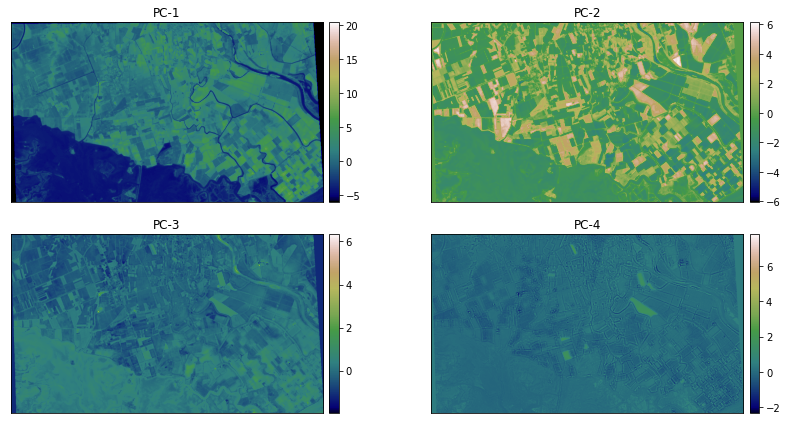

In [36]:
ep.plot_bands(np.moveaxis(data_pca.reshape((689, 1200, data_pca.shape[1])), -1, 0),
              cmap = 'gist_earth',
              cols = 2,
              figsize = (12, 6),
              title = [f'PC-{i}' for i in range(1,5)])

plt.show()

## 5. Clustering

### 5.1 K-Means

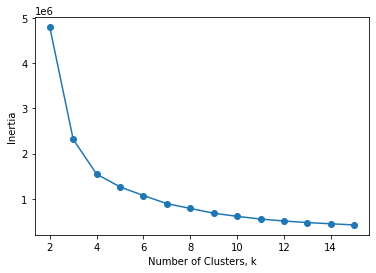

In [39]:
# Elbow method: fit clusterings with different number of centroids
# and take the one from which metric (e.g., inertia) doesn't improve significantly
inertia = []
clusters = list(range(2,16))
for k in clusters:
    kmeans = KMeans(n_clusters=k,
                    init='k-means++',
                    random_state=10) # always define it!
    kmeans.fit(data_pca)
    inertia.append(kmeans.inertia_)
# Plot k vs inertia
plt.plot(clusters,inertia)
plt.scatter(clusters,inertia)
plt.xlabel('Number of Clusters, k')
plt.ylabel('Inertia');

In [41]:
# According to the elbow method
# 5 or 6 clusters seems to be enough
kmeans = KMeans(n_clusters=5,
                init='k-means++',
                random_state=10)
kmeans.fit(data_pca)

KMeans(n_clusters=5, random_state=10)

In [42]:
labels = kmeans.predict(data_pca)

In [43]:
# Labels
np.unique(labels)

array([0, 1, 2, 3, 4], dtype=int32)

In [44]:
labels.shape

(826800,)

### 5.2 Visualize Clusters

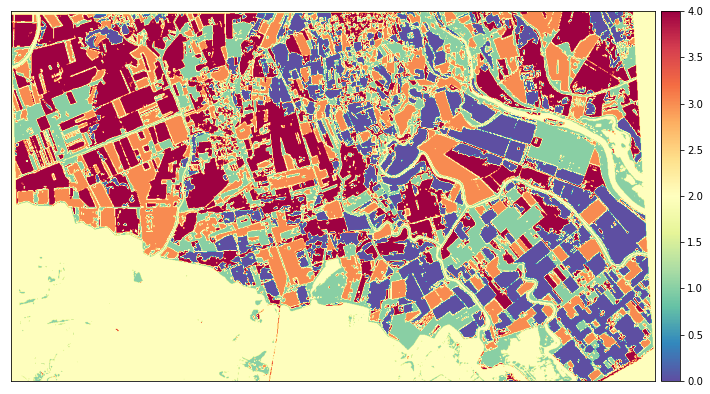

In [52]:
ep.plot_bands(labels.reshape(689, 1200), 
              figsize = (12, 16),
              cmap='Spectral_r'
              #cmap=ListedColormap(['darkgreen',
              #                     'green',
              #                     'black',
              #                     '#CA6F1E',
              #                     'navy',
              #                     'forestgreen'])
             )
plt.show()

### 5.3 Interactive Plot with Plotly

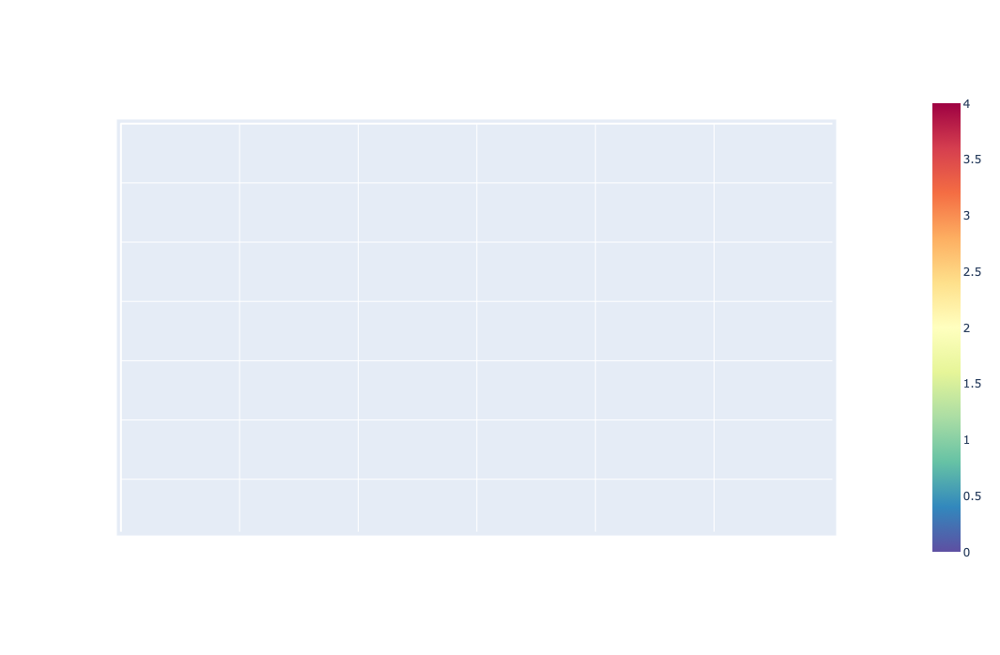

In [47]:
fig = px.imshow(labels.reshape(689, 1200), color_continuous_scale ='Spectral_r')
fig.update_xaxes(showticklabels=False)
fig.update_yaxes(showticklabels=False)

fig.update_layout(
    autosize=False,
    width=1200,
    height=698,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    # paper_bgcolor="LightSteelBlue",
)